In [1]:

%load_ext autoreload
%autoreload 2

In [2]:
from wbfm.utils.projects.finished_project_data import ProjectData
from wbfm.utils.general.utils_paper import apply_figure_settings
import plotly.express as px

/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


# Step 1: using my project class

Note: you will need to update the path if you are not on the cluster. If you have /scratch mounted, this might work:

fname = "Z:/neurobiology/zimmer/fieseler/wbfm_projects/2022-11-27_spacer_7b_2per_agar/ZIM2165_Gcamp7b_worm1-2022_11_28/project_config.yaml"

In [3]:
# Use a project with external stimulus as an additional behavior annotation
fname = "/lisc/scratch/neurobiology/zimmer/brenner/wbfm_projects/analyze/immobilized_wt/2023-09-19_11-42_worm1-2023-09-19/project_config.yaml"
project_data_gcamp = ProjectData.load_final_project_data_from_config(fname)

ConfigFile  : INFO     =======================================
Project data for directory:
/lisc/scratch/neurobiology/zimmer/brenner/wbfm_projects/analyze/immobilized_wt/2023-09-19_11-42_worm1-2023-09-19 
With raw data in directory:
None 
See self.worm_posture_class for information on behavioral parameters
Found the following data files:
============Raw Videos=================
red_data:                 True
green_data:               True
============Segmentation===============
raw_segmentation:         True
colored_segmentation:     True
============Tracking===================
tracklets:                True
final_tracks:             True
manual_tracking:          True
============Traces=====================
traces:                   True




# Step 2: Use a function to make a grid plot

ConfigFile  : WARNING  min_nonnan was passed, but neuron_names was also passed. Ignoring min_nonnan
ConfigFile  : INFO     Found 186 neurons; shaping to grid of shape (38, 5)


0it [00:00, ?it/s]

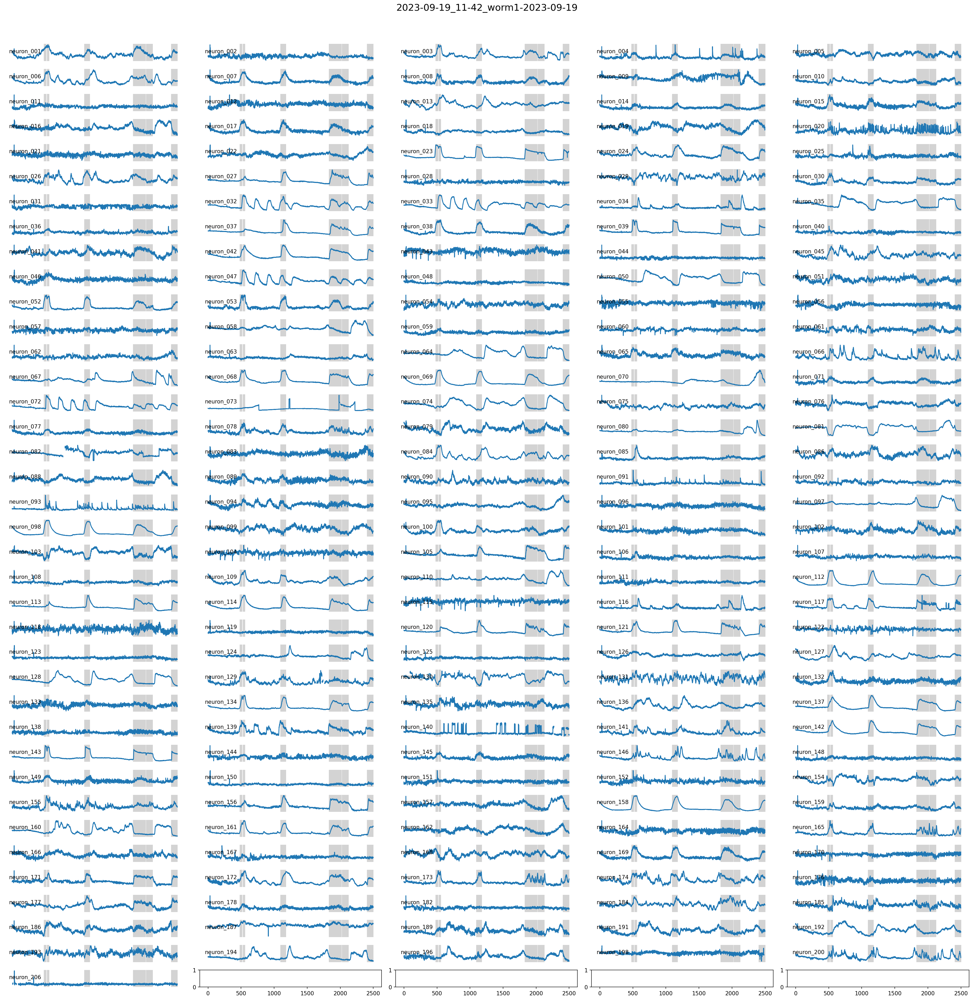

In [8]:
from wbfm.utils.visualization.plot_traces import make_grid_plot_from_project

# trace_options = dict(use_paper_options=True)  # If you like
trace_options = dict()
fig = make_grid_plot_from_project(project_data_gcamp, trace_kwargs=trace_options,
                                  min_nonnan=0.95,
                                  to_save=False)

In [6]:
# There are many options for this function, use help to check them out:
help(make_grid_plot_from_project)

Help on function make_grid_plot_from_project in module wbfm.utils.visualization.plot_traces:

make_grid_plot_from_project(project_data: wbfm.utils.projects.finished_project_data.ProjectData, channel_mode: str = 'ratio', calculation_mode: str = 'integration', neuron_names_to_plot: list = None, filter_mode: str = 'no_filtering', color_using_behavior=True, remove_outliers=False, bleach_correct=True, behavioral_correlation_shading=None, direct_shading_dict=None, df_traces: pandas.core.frame.DataFrame = None, postprocessing_func: Union[<built-in function callable>, NoneType] = None, min_nonnan=None, share_y_axis=False, to_save=True, savename_suffix='', title_str=None, trace_kwargs=None, **kwargs)
    See project_data.calculate_traces for details on the arguments, and TracePlotter for even more detail
    
    See make_grid_plot_from_dataframe for a lower-level function that doesn't require a project object
    
    Design of this function:
        Build a dataframe of traces.
            Wi

# Advanced: adding stimulus

Requires a .csv file with the starts and ends of the stimulus period in Volumes. Example:

/lisc/scratch/neurobiology/zimmer/brenner/wbfm_projects/analyze/immobilized_wt/2023-09-19_11-42_worm1-2023-09-19/3-tracking/manual_annotation/stimulus.csv


## Sort by correlation to a stimulus


ConfigFile  : INFO     Found 180 neurons; shaping to grid of shape (36, 5)


0it [00:00, ?it/s]

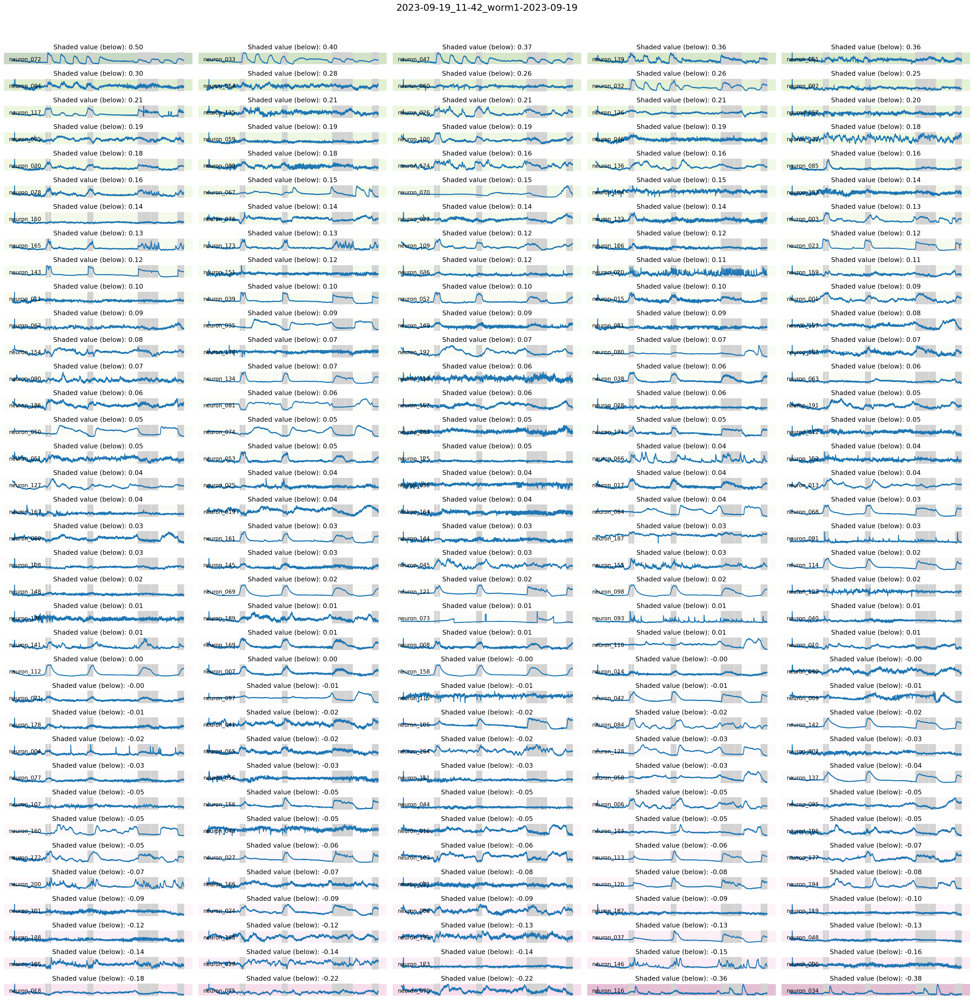

In [18]:
from wbfm.utils.visualization.plot_traces import make_grid_plot_from_project
from wbfm.utils.general.utils_behavior_annotation import BehaviorCodes

# trace_options = dict(use_paper_options=True)  # If you like
trace_options = dict()
sorting_options = dict(behavioral_correlation_shading='stimulus', sort_using_shade_value=True)
base_options = dict(min_nonnan=0.99, to_save=False, trace_kwargs=trace_options)
fig = make_grid_plot_from_project(project_data_gcamp, **sorting_options, **base_options)

## Plot the behavior as a shaded overlay (not sorting)

ConfigFile  : INFO     Found 180 neurons; shaping to grid of shape (36, 5)


0it [00:00, ?it/s]

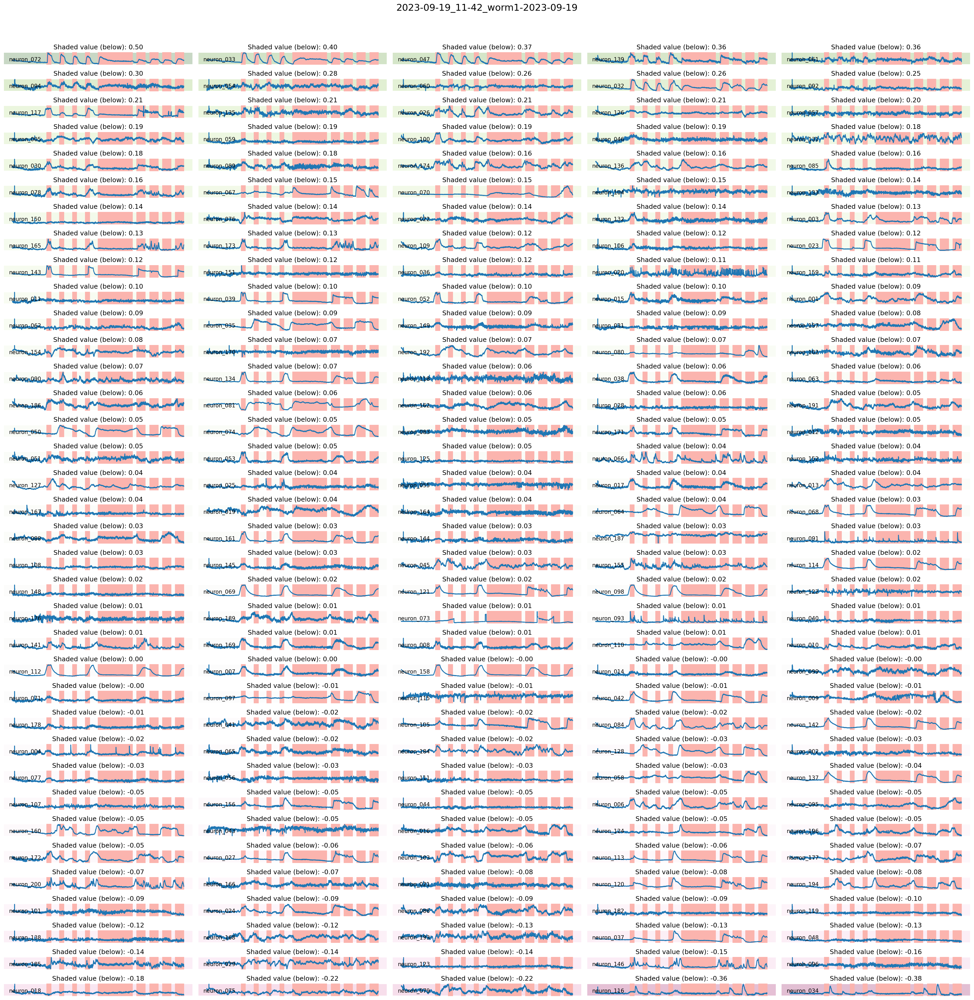

In [19]:
from wbfm.utils.visualization.plot_traces import make_grid_plot_from_project
from wbfm.utils.general.utils_behavior_annotation import BehaviorCodes

trace_options = dict()
base_options = dict(min_nonnan=0.99, to_save=False, trace_kwargs=trace_options)
shade_plot_options = dict(shade_plot_kwargs=dict(additional_shaded_states=[BehaviorCodes.STIMULUS], behaviors_to_ignore=[BehaviorCodes.REV]))

fig = make_grid_plot_from_project(project_data_gcamp, **base_options, **shade_plot_options, **sorting_options)


# Advanced: plot another time series on top of this dataframe

In principle, any dataframe can be plotted on top of this grid. We will make a dummy one here



In [24]:
import numpy as np

In [27]:
# Make dataframe to add

# First get the traces
df_traces = project_data_gcamp.calc_default_traces()

# Use a behavior time series as the second trace
y_stimulus = project_data_gcamp.worm_posture_class.calc_behavior_from_alias('stimulus')
# The columns should be the same as the original trace dataframe
df_behavior = df_traces.copy()
df_behavior[:] = np.array([y_stimulus] * df_behavior.shape[1]).T

df_behavior.head()

,neuron_001,neuron_002,neuron_003,neuron_004,neuron_005,neuron_006,neuron_007,neuron_008,neuron_009,neuron_010,...,neuron_195,neuron_196,neuron_197,neuron_198,neuron_199,neuron_200,neuron_201,neuron_206,neuron_209,neuron_211
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# Use a different function to easily plot two dataframes on top of each other
from wbfm.utils.visualization.plot_traces import make_grid_plot_from_two_dataframes

make_grid_plot_from_two_dataframes(df_traces, df_behavior, to_save=False)